# **1. Preâmbulo**

O que veremos?

- Aplicação dos primeiros conceitos da aula "Operações Pontuais (Ponto a Ponto)"

Recomendações:

- Caso já não tenha feito, assista os vídeos de nivelamento de Python disponíveis no Moodle
- Se já possui noção da linguagem, mas se considere sem prática, assista, em especial, os últimos vídeos do material em questão
- Lembre-se de **salvar** de tempos em tempos seu Notebook. Ao contrário da maioria das ferramentas da plataforma da Google, o Colab necessita de salvamento de tempos em tempos

## **1.1 Importações de módulos Python (bibliotecas)**

In [ ]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from pprint import pprint

## **1.2 Parâmetros gerais**

In [ ]:
# Altere o path abaixo para o caminho de seu Drive
path = '/content/drive/MyDrive/2023 1/PDI/Notebooks-aulas/Operações Ponto a Ponto/'

# **2 Funções auxiliares**

## **2.1 Função `exibe_mosaico`**

- Para mais detalhes, consulte o Notebook do capítulo "Entropia, Ruídos e Métricas"

In [ ]:
def exibe_mosaico(imagens, legendas, colunas=4, arquivo=None):
  # Largura e altura básicos, de referência, das imagens
  l = 8
  a = 6

  n_imagens = len(imagens)
  if len(imagens) < colunas:
    colunas = len(imagens)
  linhas = n_imagens // colunas + int(n_imagens % colunas > 0)

  fig = plt.figure(figsize=(l*colunas,a*linhas))
  ax = []

  i = j = 0
  for pos, img in enumerate(imagens):
    i = pos // colunas
    j = pos % colunas
    ax.append(fig.add_subplot(linhas, colunas, pos+1))
    ax[-1].axis('off')
    if img.mode == 'L' or img.mode == '1':
      img = img.convert('RGB')
    arr = np.asarray(img)
    ax[-1].imshow(arr)
    ax[-1].set_title(legendas[pos])

  fig.tight_layout()

  if arquivo is not None:
    plt.savefig(arquivo, dpi=300)

  plt.show()

## **2.2 Função `gera_imagem`**

- Para mais detalhes, consulte o Notebook do capítulo "Entropia, Ruídos e Métricas"

In [ ]:
def gera_imagem(arr_orig):
  arr = arr_orig.copy()
  arr[arr > 255] = 255
  arr[arr < 0] = 0
  arr = np.round(arr).astype(np.uint8)
  return Image.fromarray(arr)

# **3 Primeiros exemplos**

In [ ]:
# Produto de matrizes versus produto de arranjos matriciais

A = [
    [6, 5, 1],
    [6, 5, 4],
    [2, 2, 2]
]
A = np.array(A)

B = [
    [2, 3, 1],
    [3, 3, 2],
    [2, 1, 3]
]
B = np.array(B)

# Produto de arranjo matricial:
C = A * B

print('Produto de arranjo:\n')
pprint(C)

# Produto de matrizes:
D = np.dot(A, B)

print('\nProduto de matrizes:\n')
pprint(D)

# Produto de arranjo matricial é simétrico
E = B * A

print('\nProduto de arranjo (inv):\n')
pprint(E)

# Produto de matrizes não é simétrico:
F = np.dot(B, A)

print('\nProduto de matrizes (inv):\n')
pprint(F)

Produto de arranjo:

array([[12, 15,  1],
       [18, 15,  8],
       [ 4,  2,  6]])

Produto de matrizes:

array([[29, 34, 19],
       [35, 37, 28],
       [14, 14, 12]])

Produto de arranjo (inv):

array([[12, 15,  1],
       [18, 15,  8],
       [ 4,  2,  6]])

Produto de matrizes (inv):

array([[32, 27, 16],
       [40, 34, 19],
       [24, 21, 12]])


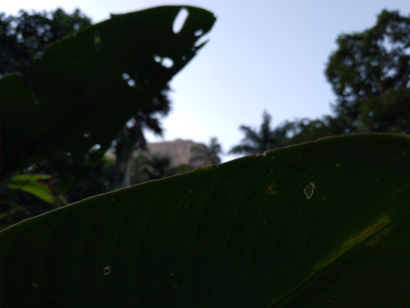

In [ ]:
img = Image.open(path + 'folha.jpg')
display(img)

Valor máximo: 305 Valor mínimo: 50


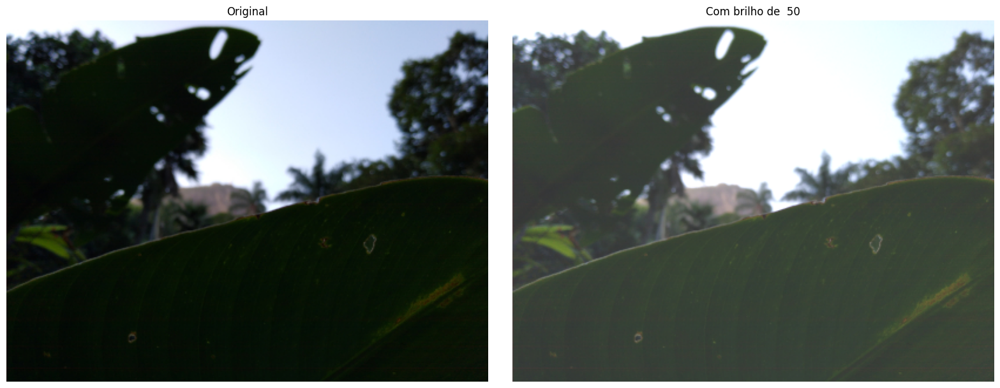

In [ ]:
brilho = 50

# Atenção ao tipo
arr = np.asarray(img).astype(int) + brilho

print('Valor máximo:', arr.max(), 'Valor mínimo:', arr.min())

imgBrilho = gera_imagem(arr)

exibe_mosaico([img, imgBrilho], ['Original', 'Com brilho de %3d' % brilho])

(599, 423, 3)
(423, 3)
(3,)
[510 509 510]


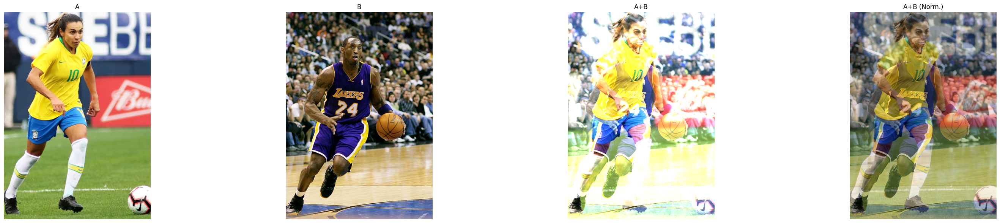

In [ ]:
img1 = Image.open(path + 'marta.png').convert('RGB')
img2 = Image.open(path + 'kobe.png').convert('RGB')

arr1 = np.asarray(img1).astype(int)
arr2 = np.asarray(img2).astype(int)

arr3 = arr1 + arr2

img3 = gera_imagem(arr3)

mx = np.max(arr3.max(axis=0), axis=0)
print(arr3.shape)
print(np.max(arr3, axis=0).shape)
print(np.max(arr3.max(axis=0), axis=0).shape)
print(mx)
mn = np.min(arr3.min(axis=0), axis=0)

arr4 = (arr3 - mn) / (mx - mn) * 255
img4 = gera_imagem(arr4)

imagens = [img1, img2, img3, img4]
legendas = ['A', 'B', 'A+B', 'A+B (Norm.)']

exibe_mosaico(imagens, legendas)

In [ ]:
a = 300
mx = 510
mn = 50
novomn = 10
novomx = 300

novoa = (a - mn) / (mx - mn) * (novomx - novomn) + novomn

print(a)
print(mx - mn)
print(a - mn)
print((a - mn) / (mx - mn))
print((a - mn) / (mx - mn) * (novomx - novomn))
print(novoa)

# novoa = (a - mn) / (mx - mn) * (novomx - 0) + 0 equivale a
# novoa = (a - mn) / (mx - mn) * novomx

300
460
250
0.5434782608695652
157.6086956521739
167.6086956521739


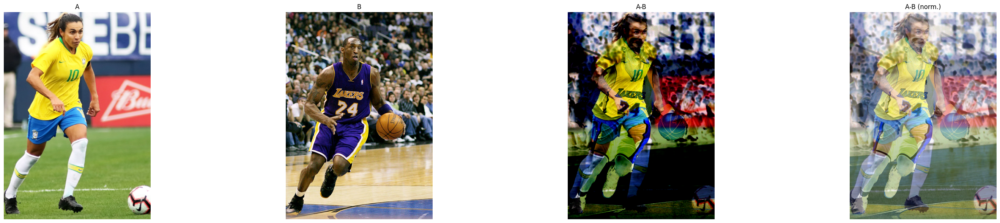

In [ ]:
arr5 = arr1 - arr2

img5 = gera_imagem(arr5)

mx = np.max(arr5.max(axis=0), axis=0)
mn = np.min(arr5.min(axis=0), axis=0)

arr6 = (arr5 - mn) / (mx - mn) * 255
img6 = gera_imagem(arr6)

imagens = [img1, img2, img5, img6]
legendas = ['A', 'B', 'A-B', 'A-B (norm.)']

exibe_mosaico(imagens, legendas)

Valor máximo: 127.5 Valor mínimo: 0.0


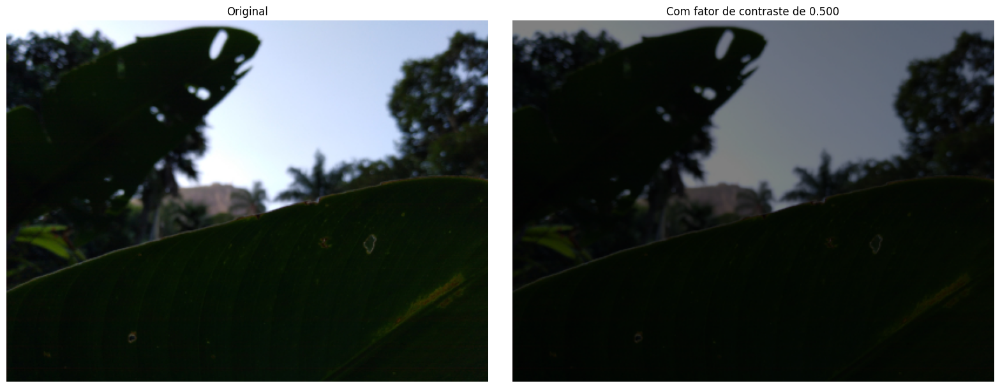

In [ ]:
contraste = 0.5

# Atenção ao tipo
arr = np.asarray(img).astype(int) * contraste

print('Valor máximo:', arr.max(), 'Valor mínimo:', arr.min())

imgContraste = gera_imagem(arr)

exibe_mosaico([img, imgContraste], ['Original', 'Com fator de contraste de %.3f' % contraste])

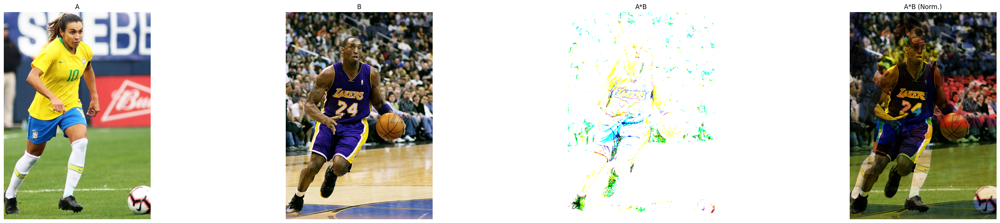

In [ ]:
arr7 = arr1 * arr2

img7 = gera_imagem(arr7)

mx = np.max(arr7.max(axis=0), axis=0)
mn = np.min(arr7.min(axis=0), axis=0)

arr8 = (arr7 - mn) / (mx - mn) * 255
img8 = gera_imagem(arr8)

imagens = [img1, img2, img7, img8]
legendas = ['A', 'B', 'A*B', 'A*B (Norm.)']

exibe_mosaico(imagens, legendas)

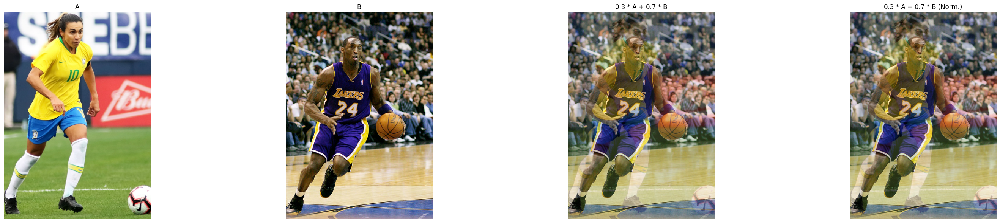

In [ ]:
a = 0.3
b = 0.7
arr9 = a * arr1 + b *arr2

img9 = gera_imagem(arr9)

mx = np.max(arr9.max(axis=0), axis=0)
mn = np.min(arr9.min(axis=0), axis=0)

arr10 = (arr9 - mn) / (mx - mn) * 255
img10 = gera_imagem(arr10)

imagens = [img1, img2, img9, img10]
legendas = ['A', 'B', '%.1f * A + %.1f * B' % (a, b), '%.1f * A + %.1f * B (Norm.)' % (a, b)]

exibe_mosaico(imagens, legendas)

(619, 966, 3)


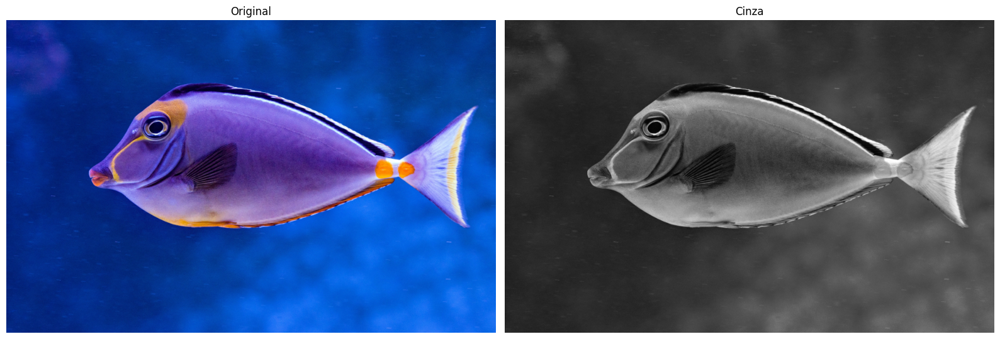

In [ ]:
img = Image.open(path + 'blue_tang.jpg')
arr = np.asarray(img).astype(int)
print(arr.shape)
arr = arr[:,:,0] * 0.299 + arr[:,:,1] * 0.587 + arr[:,:,2] * 0.114

imgCinza = gera_imagem(arr)

imagens = [img, imgCinza]
legendas = ['Original', 'Cinza']
exibe_mosaico(imagens, legendas)

(3,) (3,)


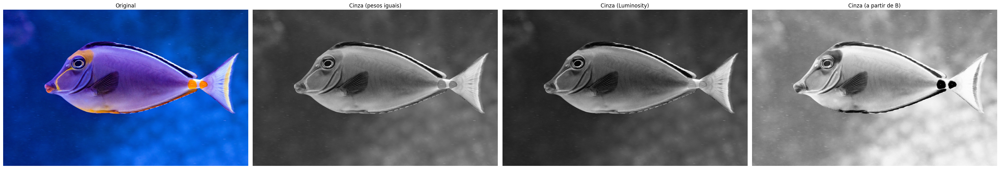

In [ ]:
img = Image.open(path + 'blue_tang.jpg')
arr = np.asarray(img).astype(int)

# o atributo .T entrega a transposta da matriz
transf = np.array([0.33, 0.34, 0.33]).T

print(transf.shape, transf.T.shape)

arr1 = np.dot(arr, transf)

imgCinza = gera_imagem(arr1)

transf = np.array([0.299, 0.587, 0.114]).T

arr2 = np.dot(arr, transf)

imgCinza2 = gera_imagem(arr2)

transf = np.array([0, 0, 1]).T

arr3 = np.dot(arr, transf)

imgCinza3 = gera_imagem(arr3)

imagens = [img, imgCinza, imgCinza2, imgCinza3]
legendas = ['Original', 'Cinza (pesos iguais)', 'Cinza (Luminosity)', 'Cinza (a partir de B)']
exibe_mosaico(imagens, legendas)

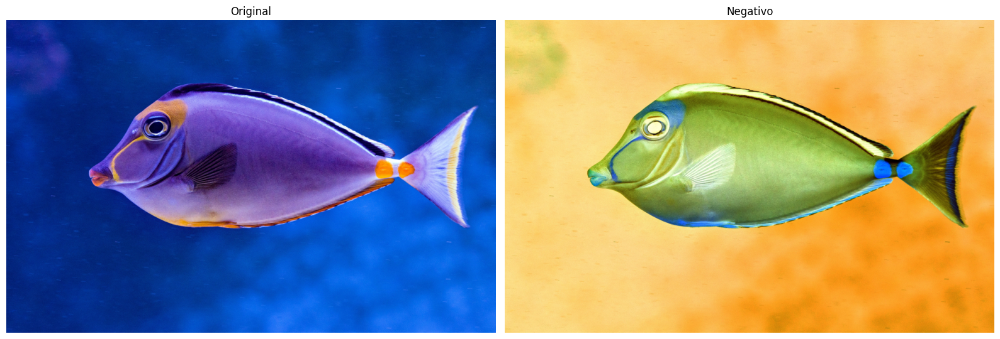

In [ ]:
arr = 255 - np.asarray(img).astype(int)

imgCinza = gera_imagem(arr)

imagens = [img, imgCinza]
legendas = ['Original', 'Negativo']
exibe_mosaico(imagens, legendas)